In [1]:
!nvidia-smi

Fri Mar  8 13:14:17 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.12             Driver Version: 535.104.12   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA A100 80GB PCIe          On  | 00000000:11:00.0 Off |                    0 |
| N/A   33C    P0              42W / 300W |      4MiB / 81920MiB |      0%      Default |
|                                         |                      |             Disabled |
+-----------------------------------------+----------------------+--

In [2]:
# !git clone https://github.com/tldrafael/DeepLabV3Plus-Pytorch
# !mv DeepLabV3Plus-Pytorch deeplabv3

In [3]:
# !apt install -y wget zip
# !wget https://prod-dcd-datasets-cache-zipfiles.s3.eu-west-1.amazonaws.com/hssswvmjwf-1.zip
# !unzip -d. hssswvmjwf-1.zip 
# !unzip -d. 'Road Traversing Knowledge/RTK.zip'

In [4]:
import os
os.environ['CUDA_VISIBLE_DEVICES'] = '1'

In [5]:
from torchvision.io import read_image
import numpy as np
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as T
import matplotlib.pyplot as plt
import torch
from seaborn import color_palette
from PIL import Image
from torch import nn
from pisss import utils as ut
import pandas as pd
from deeplabv3 import deeplabv3plus_resnet50

Backbone HRNet Pretrained weights at: ./checkpoints/hrnetv2_32_model_best_epoch96.pth, only usable for HRNetv2-32


In [6]:


def set_randomseed(seed=None, return_seed=False):
    
    if seed is None:
        seed = np.random.randint(2147483647)
    
    np.random.seed(seed)
    torch.manual_seed(seed)
    if return_seed:
        return seed

normalize_back =  T.Normalize(
            mean=[-.485/.229, -.456/.224, -.406/.225],
            std=[1/.229, 1/.224, 1/.225])


class SimpleDataset(Dataset):
    
    def __init__(
        self, annotation_file, dirbase=None, has_label=True,
        transform=None, transform_target=None,
        transform_color=None, ix_nolabel=255, fl_normalize=True, **kwargs
    ):

        with open(annotation_file, 'r') as f:
            self.impaths = f.read().split('\n')[:-1]

        if dirbase is not None:
            self.impaths = [os.path.join(dirbase, p) for p in self.impaths]

        if has_label:
            self.labelpaths = [p.replace('/image/', '/label/') for p in self.impaths]

        self.dirbase = dirbase
        self.has_label = has_label
        self.transform = transform
        self.transform_color = transform_color
        self.fl_transform_color = transform_color is not None
        self.transform_target = transform_target
        self.ix_nolabel = ix_nolabel
        self.fl_normalize = fl_normalize

        self.normalize =  T.Normalize(
            mean=[.485, .456, .406], std=[.229, .224, .225])

        self.remap_labels = torch.concat([
            torch.arange(8),
            torch.tensor([-1]),
            torch.arange(8, 12)
        ])

    
    def __len__(self):
        return len(self.impaths)

    def __getitem__(self, idx):
        image = read_image(self.impaths[idx])

        if self.fl_transform_color:
            # The color transformation doesn't follow the set seed.
            image = self.transform_color(image)

        if self.transform:
            state = set_randomseed(return_seed=True)
            image = self.transform(image)

        if self.has_label:
            label = read_image(self.labelpaths[idx])

            if self.transform:
                set_randomseed(seed=state)
                label = self.transform_target(label).to(torch.uint8)

            label = label.long()
            label = self.remap_labels[label]
            
            assert (label != self.ix_nolabel).all(), \
                f'shouldn\'t have any label of class {self.ix_nolabel}'
        else:
            label = self.ix_nolabel + torch.zeros(image.shape, dtype=torch.long)

        if self.fl_normalize:
            return self.normalize(image / 255), label
        else:
            return image, label


def plot_grid(inp, fl_normalize_back=False):
    tmp = inp.clone()
    if fl_normalize_back:
        tmp = normalize_back(tmp)
    
    tmp = tmp.moveaxis(0, -2).flatten(-2, -1).permute(1,2,0)
    plt.imshow(tmp)
    plt.show()


class Colorizer:

    def __init__(self, n_classes):
        range = np.linspace(0, 1, n_classes)
        colors = color_palette('gist_rainbow', as_cmap=True)(range)
        colors = colors[..., :3]
        colors = np.concatenate([np.array([[0,0,0]]), colors])
        self.colors = colors

    def __call__(self, classmap):
        return self.colors[classmap]


class TorchColorizer(Colorizer):

    def __init__(self, *args, **kwargs):
        super().__init__(*args, **kwargs)
        self.colors = torch.Tensor(self.colors)

    def __call__(self, classmap):
        tmp = self.colors[classmap]
        return tmp.permute(0,4,2,3,1)[...,0]


def float_to_uint8(x):
    return (x*255).round().clip(0,255).astype(np.uint8)

In [7]:
crop_size = (224, 224)

T_crop = T.Compose([
    T.RandomCrop(size=crop_size),
    T.RandomHorizontalFlip(p=.5)
])

train_ds = SimpleDataset(
    annotation_file='RTK/trainpaths.txt', dirbase='RTK/',
    transform=T_crop, transform_target=T_crop
)

train_loader = DataLoader(train_ds, batch_size=8, shuffle=True)

In [8]:
for inp_im, inp_label in train_loader:
    break
    

dummy_im = inp_im.clone()[:6]
dummy_label = inp_label.clone()[:6]

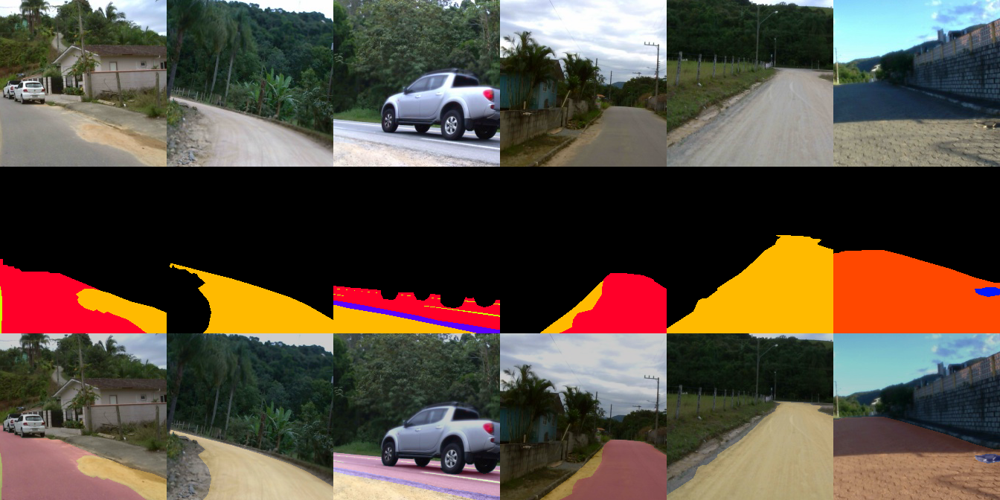

In [9]:
colorizer = TorchColorizer(13)

ims = normalize_back(dummy_im)
labels = colorizer(dummy_label)
alpha = .2
blend = (1-alpha)*ims + alpha*labels

tmp = torch.concat([ims, labels, blend], axis=-2)
tmp = tmp.moveaxis(0,-2).flatten(-2,-1).permute(1,2,0)
tmp = float_to_uint8(tmp.numpy())
Image.fromarray(tmp)

In [10]:
import torch.nn.functional as F
from torch.optim.lr_scheduler import _LRScheduler
from torch.utils.tensorboard import SummaryWriter
from datetime import datetime
from torch.utils.tensorboard import SummaryWriter



def compute_diceloss(
    pred, label, conf_thrs=None, return_mean=True, n_classes=12, ignore_index=255
):
    
    if ignore_index in label:
        label[label == ignore_index] = n_classes
        label_onehot = F.one_hot(label, num_classes=n_classes + 1).permute(0, 3, 1, 2)
        label_onehot = label_onehot[:, :n_classes]
    else:
        label_onehot = F.one_hot(label, num_classes=n_classes).permute(0, 3, 1, 2)

    assert label_onehot.shape == pred.shape

    if conf_thrs is None:
        dice_score = (label_onehot * pred).sum([0, 2, 3]) / (label_onehot + pred).sum([0, 2, 3]).clamp_min(1e-3)
    else:
        conf_mask = 1. * (pred.amax(1, keepdim=True) >= conf_thrs)
        denom = ((label_onehot + pred) * conf_mask).sum([0, 2, 3]).clamp_min(1e-3)
        dice_score = (label_onehot * pred * conf_mask).sum([0, 2, 3]) / denom

    if return_mean:
        return 1 - dice_score.mean()
    else:
        return 1 - dice_score


def get_CM(pred, label, n_classes):
    cm = np.bincount(
        n_classes * label.flatten() + pred.flatten(),
        minlength=n_classes ** 2)
    
    return cm.reshape(
        n_classes, n_classes, order='F').astype(int)


def get_CM_fromloader(dloader, model, n_classes, ix_nolabel=255):
    # https://github.com/Qualcomm-AI-research/InverseForm/blob/be142136087579d5f7175cbf64c171fc52352fc7/utils/misc.py#L20
    # stretch ground truth labels by num_classes
    # TP at 0 + 0, 1 + 1, 2 + 2 ...  # TP exist where value == num_classes*class_id + class_id
    # FP = row[class].sum() - TP
    # FN = col[class].sum() - TP
    CM_abs = np.zeros((n_classes, n_classes), dtype=int)
    
    for inp_data, inp_label in dloader:
        
        test_preds = model(inp_data.cuda())
        test_preds = test_preds.argmax(1, keepdim=True).cpu()
        
        for pr_i, y_i in zip(test_preds, inp_label):
            
            if ix_nolabel is None:
                CM_abs += get_CM(pr_i, y_i, n_classes)
            else:
                if (pr_i == ix_nolabel).sum().item() > 0:
                    warnings.warn(
                        'The model has also predicted ix_nolabel value, '
                        'these pixels are also being ignored '
                        ' - thus, this metric is not correct!'
                    )
                
                mask = (y_i != ix_nolabel) & (pr_i != ix_nolabel)
                CM_abs += get_CM(pr_i[mask], y_i[mask], n_classes)

    
    pred_P = CM_abs.sum(axis=0)
    gt_P = CM_abs.sum(axis=1)
    true_P = np.diag(CM_abs)

    CM_iou = true_P / (pred_P + gt_P - true_P)
    miou = np.nanmean(CM_iou)
    return miou, CM_iou, CM_abs


class WarmupLR(_LRScheduler):

    def __init__(
        self, optimizer, min_lr_factor=0.001, logger=None,
        n_warmup_max=5, **kwargs
    ):

        # avoid lr changes after calling super
        base_lrs_bkp = [pg['lr'] for pg in optimizer.param_groups]
        
        self.min_lr_factor = min_lr_factor
        self.n_warmup_max = n_warmup_max
        self.n_warmup = 1
        self.fl_warmup = True
        
        super().__init__(optimizer)
        self.base_lrs = base_lrs_bkp

    def get_lr(self):
        wu_lrs = []
        if self.fl_warmup:
            for blr in self.base_lrs:
                wu_lr = blr * self.min_lr_factor + \
                    blr * (1 - self.min_lr_factor) * \
                    (self.n_warmup - 1) / self.n_warmup_max
                wu_lrs.append(wu_lr)

            self.n_warmup += 1.
            if self.n_warmup > (self.n_warmup_max + 1):
                self.fl_warmup = False
        else:
            wu_lrs = self.base_lrs

        return wu_lrs



def save_ckpt(p, model, opt, miou_val):
    torch.save({
        'state': model.state_dict(),
        'opt_state': opt.state_dict(),
        'best_miou': miou_val
    }, p)


class LaplacianLoss(nn.Module):

    def __init__(self, max_levels=3, channels=1):
        super().__init__()
        self.max_levels = max_levels
        self.gauss_kernel = T.GaussianBlur(kernel_size=5, sigma=2)
        self.denom = sum(2**(self.max_levels-i-1) for i in range(self.max_levels))

    def half_downsample(self, x):
        return T.functional.resize(x, size=(x.shape[2]//2, x.shape[3]//2))

    def laplacian_pyramid(self, x):
        current = x
        pyr = []
        for level in range(self.max_levels):
            filtered = self.gauss_kernel(current)
            diff = current - filtered
            pyr.append(diff)
            if level < self.max_levels:
                current = self.half_downsample(filtered)
        return pyr

    def forward(self, input_, target):
        pyr_input  = self.laplacian_pyramid(input_)
        pyr_target = self.laplacian_pyramid(target)
        # mae_loss = sum(torch.nn.functional.l1_loss(a, b) for a, b in zip(pyr_input, pyr_target))
        mae_loss = 0
        for i, (pi, pt), in enumerate(zip(pyr_input, pyr_target)):
            mae_loss += 2**(self.max_levels-i-1)*torch.nn.functional.l1_loss(pi, pt)
        mae_loss /= self.denom
        mae_loss *= self.max_levels
        return mae_loss


class LaplaciaLossMultiClass(nn.Module):

    def __init__(self):
        super().__init__()
        self.laplacian = LaplacianLoss()

    def forward(self, probs, label):
        n_classes = probs.shape[1]
        
        loss = torch.tensor([0.])
        for cl_i in range(n_classes):
            label_i = (label == cl_i)[:, None] * 1.
            pred_i = probs[:, [cl_i]]
            loss = self.laplacian(pred_i, label_i) / n_classes

        return loss


class GradientPenaltyLoss(nn.Module):

    def __init__(self):
        super().__init__()

        self.sobel_x = nn.Conv2d(
            1, 1, kernel_size=3, stride=1, padding='same', bias=False)
        self.sobel_x.weight = nn.Parameter(torch.tensor(
            [[[[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]]]]).float())

        self.sobel_y = nn.Conv2d(
            1, 1, kernel_size=3, stride=1, padding='same', bias=False)
        self.sobel_y.weight = nn.Parameter(torch.tensor(
            [[[[-1, -2, -1], [0, 0, 0], [1, 2, 1]]]]).float())

        for p in self.parameters():
            p.requires_grad = False

        self.cuda()

    def forward(self, pred, gt, ur=None):
        pred_grad_x = self.sobel_x(pred)
        gt_grad_x = self.sobel_x(gt)

        pred_grad_y = self.sobel_y(pred)
        gt_grad_y = self.sobel_y(gt)

        if ur is not None:
            pred_grad_x = pred_grad_x[ur]
            gt_grad_x = gt_grad_x[ur]
            pred_grad_y = pred_grad_y[ur]
            gt_grad_y = gt_grad_y[ur]

        loss = \
            F.l1_loss(pred_grad_x, gt_grad_x) + \
            F.l1_loss(pred_grad_y, gt_grad_y) + \
            0.01 * pred_grad_x.__abs__().mean() + \
            0.01 * pred_grad_y.__abs__().mean()

        return loss



class GradLossMultiClass(nn.Module):

    def __init__(self):
        super().__init__()
        self.gradloss = GradientPenaltyLoss()

    def forward(self, probs, label):
        n_classes = probs.shape[1]
        
        loss = torch.tensor([0.])
        for cl_i in range(n_classes):
            label_i = (label == cl_i)[:, None] * 1.
            pred_i = probs[:, [cl_i]]
            loss = self.gradloss(pred_i, label_i) / n_classes

        return loss


compute_laplacian = LaplaciaLossMultiClass()
compute_gradloss = GradLossMultiClass()


In [11]:

tr_params = {
    'fl_stemstride': True,
    'fl_richstem': False,
    'fl_parallelstem': False,
    'fl_maxpool': False,
    'fl_lfe': False,
    'fl_transpose': False,
}


n_classes = 12
model = deeplabv3plus_resnet50(**tr_params, num_classes=n_classes)

Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/hub/checkpoints/resnet50-19c8e357.pth
100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 97.8M/97.8M [00:00<00:00, 128MB/s]


In [12]:
ix_nolabel = 255
CE = nn.CrossEntropyLoss(reduction='mean', ignore_index=ix_nolabel)

# opt = torch.optim.AdamW(model.parameters(), lr=1e-4)
opt = torch.optim.SGD(
    model.parameters(), lr=1e-2, momentum=0.9, weight_decay=5e-4)


scheduler = WarmupLR(opt, n_warmup_max=10)
warmup_step = 200

time_now = datetime.now().strftime("%Y%m%d_%H%M")
time_now += '-add-gradloss+laploss'
logdir = os.path.join('logs', time_now)
writer = SummaryWriter(log_dir=logdir)


writer.flush()

In [13]:
val_ds = SimpleDataset(annotation_file='RTK/valpaths.txt', dirbase='RTK/')
val_loader = DataLoader(val_ds, batch_size=1)
train_loader = DataLoader(train_ds, batch_size=8, shuffle=True)

In [14]:
model.train().cuda()

print_every_n = 1000

iters_total = 200000

it = 1
losses = []
miou_best = 0
steps_cur = 0

lossi = []
lossi_ce = []
lossi_dice = []
lossi_lap = []
lossi_grad = []

lr_cur = opt.param_groups[0]["lr"]
print(f'lr: {lr_cur:.2e}')
writer.add_scalars('lr', {'nn': lr_cur}, steps_cur)


model.eval()
miou_train = get_CM_fromloader(train_loader, model, n_classes)[0]
miou_val = get_CM_fromloader(val_loader, model, n_classes)[0]
print(f'\tmiou-train: {miou_train:.2f}\tmiou-val: {miou_val:.2f}')
writer.add_scalars('miou', {'train': miou_train}, steps_cur)
writer.add_scalars('miou', {'val': miou_val}, steps_cur)


model.train()
while it <= iters_total:

    for inp_im, inp_label in train_loader:
        inp_im = inp_im.cuda()
        inp_label = inp_label[:, 0].cuda()
        
        logits = model(inp_im)
        probs = logits.softmax(1)
        
        loss_ce = CE(logits, inp_label)
        loss_dice = compute_diceloss(probs, inp_label)
        loss_lap = 1000*compute_laplacian(probs, inp_label)        
        loss_grad = 100*compute_gradloss(probs, inp_label)
        loss = loss_ce + loss_dice + loss_grad + loss_lap
        
        opt.zero_grad(set_to_none=True)
        loss.backward()
        opt.step()

        lossi.append(loss.item())
        lossi_ce.append(loss_ce.item())
        lossi_dice.append(loss_dice.item())
        lossi_lap.append(loss_lap.item())
        lossi_grad.append(loss_grad.item())
        it += 1

        if scheduler.fl_warmup and it % warmup_step == 0:
            scheduler.step()
            print(f'lr: {opt.param_groups[0]["lr"]:.2e}')
        
        if it % print_every_n == 0:
            steps_cur += 1

            loss_avg = np.mean(lossi)
            losses.append(loss_avg)

            loss_avg_ce = np.mean(lossi_ce)            
            loss_avg_dice = np.mean(lossi_dice)
            loss_avg_lap = np.mean(lossi_lap)
            loss_avg_grad = np.mean(lossi_grad)
            
            model.eval()
            miou_train = get_CM_fromloader(train_loader, model, n_classes)[0]
            miou_val = get_CM_fromloader(val_loader, model, n_classes)[0]
            model.train()

            print(f'it: {it}\tloss: {loss_avg:.4f}'
                  f'\tloss-ce: {loss_avg_ce:.4f}'
                  f'\tloss-dice: {loss_avg_dice:.4f}',
                  f'\tloss-lap: {loss_avg_lap:.4f}',
                  f'\tloss-grad: {loss_avg_grad:.4f}',
                  f'\tmiou-train: {miou_train:.3f}',
                  f'\tmiou-val: {miou_val:.3f}'
            )

            writer.add_scalars('objective', {'train': loss_avg}, steps_cur)
            writer.add_scalars('CE', {'train': loss_avg_ce}, steps_cur)
            writer.add_scalars('diceloss', {'train': loss_avg_dice}, steps_cur)
            writer.add_scalars('laploss', {'train': loss_avg_lap}, steps_cur)
            writer.add_scalars('gradloss', {'train': loss_avg_grad}, steps_cur)
            writer.add_scalars('miou', {'train': miou_train}, steps_cur)
            writer.add_scalars('miou', {'val': miou_val}, steps_cur)

            
            lossi = []
            lossi_ce = []
            lossi_dice = [] 
            lossi_lap = [] 
            lossi_grad = [] 

            ckpt_last_path = os.path.join(logdir, 'model.last.pth')
            save_ckpt(ckpt_last_path, model, opt, miou_val)

            if miou_val > miou_best:
                miou_best = miou_val
                ckpt_last_path = os.path.join(logdir, 'model.best.pth')
                save_ckpt(ckpt_last_path, model, opt, miou_val)

            if it > 50e3:
                for pg in opt.param_groups:
                    pg['lr'] *= .1

lr: 1.00e-05
	miou-train: 0.01	miou-val: 0.01


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


lr: 1.01e-03
lr: 2.01e-03
lr: 3.01e-03
lr: 4.01e-03
lr: 5.00e-03
it: 1000	loss: 2.1131	loss-ce: 0.6375	loss-dice: 0.8648 	loss-lap: 0.4251 	loss-grad: 0.1856 	miou-train: 0.476 	miou-val: 0.407
lr: 6.00e-03
lr: 7.00e-03
lr: 8.00e-03
lr: 9.00e-03
lr: 1.00e-02
it: 2000	loss: 1.0990	loss-ce: 0.0697	loss-dice: 0.7715 	loss-lap: 0.1970 	loss-grad: 0.0608 	miou-train: 0.696 	miou-val: 0.592
it: 3000	loss: 1.0455	loss-ce: 0.0546	loss-dice: 0.7384 	loss-lap: 0.1885 	loss-grad: 0.0639 	miou-train: 0.766 	miou-val: 0.649
it: 4000	loss: 0.9963	loss-ce: 0.0388	loss-dice: 0.7201 	loss-lap: 0.1742 	loss-grad: 0.0632 	miou-train: 0.799 	miou-val: 0.652
it: 5000	loss: 0.9703	loss-ce: 0.0327	loss-dice: 0.7108 	loss-lap: 0.1651 	loss-grad: 0.0617 	miou-train: 0.811 	miou-val: 0.678
it: 6000	loss: 0.9477	loss-ce: 0.0308	loss-dice: 0.7050 	loss-lap: 0.1539 	loss-grad: 0.0580 	miou-train: 0.815 	miou-val: 0.684
it: 7000	loss: 0.9267	loss-ce: 0.0267	loss-dice: 0.7007 	loss-lap: 0.1442 	loss-grad: 0.0551 	mi

KeyboardInterrupt: 

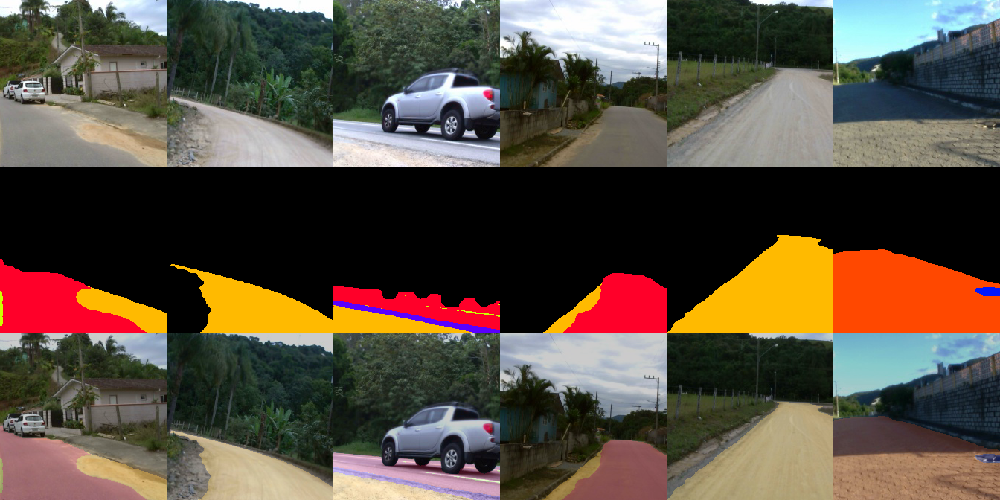

In [15]:
model.eval()
pred = model(dummy_im.cuda()).cpu().argmax(1, keepdim=True)
ims = normalize_back(dummy_im)
# labels = colorizer(dummy_label)
labels = colorizer(pred)
alpha = .2
blend = (1-alpha)*ims + alpha*labels
tmp = torch.concat([ims, labels, blend], axis=-2)
tmp = tmp.moveaxis(0,-2).flatten(-2,-1).permute(1,2,0)
tmp = float_to_uint8(tmp.numpy())
Image.fromarray(tmp)

# Comparing model with and without laploss for small damages

In [18]:
def instantiate_deeplab():
    tr_params = {
        'fl_stemstride': True,
        'fl_richstem': False,
        'fl_parallelstem': False,
        'fl_maxpool': False,
        'fl_lfe': False,
        'fl_transpose': False,
    }
    
    return deeplabv3plus_resnet50(**tr_params, num_classes=12).eval().cuda()

model_wlap = instantiate_deeplab()
model_wolap = instantiate_deeplab()

In [19]:
# model_wlap.load_state_dict(torch.load('logs/20240306_1714-test-laploss/model.best.pth')['state'])
model_wlap.load_state_dict(torch.load('logs/20240308_1314-add-gradloss+laploss/model.best.pth')['state'])
model_wolap.load_state_dict(torch.load('logs/20240306_1429-deeplabv3+sgd+benchmark/model.best.pth')['state'])

<All keys matched successfully>

In [20]:
miou_wlap = get_CM_fromloader(val_loader, model_wlap, n_classes)[1]
miou_wolap = get_CM_fromloader(val_loader, model_wolap, n_classes)[1]

print(np.mean(miou_wlap), np.mean(miou_wolap))
# 0.7588192568092113 0.7666002519313994


0.7311859559016876 0.7666002519313994


In [21]:
names = [n for _, n in ut.rtk_classnames_tidy]
df_miou = pd.DataFrame(data={'names': names, 'wlap': miou_wlap, 'wolap': miou_wolap})
df_miou[['wlap', 'wolap']] = df_miou[['wlap', 'wolap']].apply(lambda x: np.round(x*100, 2))
df_miou

,names,wlap,wolap
0,background,98.57,98.85
1,roadAsphalt,94.16,94.65
2,roadPaved,95.66,96.67
3,roadUnpaved,94.77,95.18
4,roadMarking,76.60,80.53
5,speedBump,71.93,76.88
6,catsEye,50.14,53.44
7,stormDrain,64.02,74.52
8,patch,74.26,81.63
9,waterPuddle,38.24,47.51


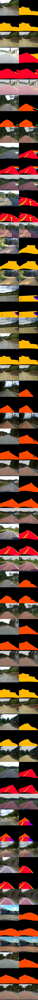

In [22]:
val_ds = SimpleDataset(annotation_file='RTK/valpaths.txt', dirbase='RTK/')
val_loader = DataLoader(val_ds, batch_size=1, shuffle=True)
model.eval()
alpha = .2
nplot = 20    

plot_ims = []
for inp_im, inp_label in val_loader:
    pred_wlap = model_wlap(inp_im.cuda()).cpu().argmax(1, keepdim=True)
    pred_wolap = model_wolap(inp_im.cuda()).cpu().argmax(1, keepdim=True)
    
    im = normalize_back(inp_im)
    label = colorizer(inp_label)
    
    pred_wlap = colorizer(pred_wlap)
    pred_wolap = colorizer(pred_wolap)
    
    blend_wlap = (1-alpha)*im + alpha*pred_wlap
    blend_wolap = (1-alpha)*im + alpha*pred_wolap
    
    tmp = torch.concat([
        torch.concat([im, label], axis=-1),
        torch.concat([pred_wlap, pred_wolap], axis=-1),
        torch.concat([blend_wlap, blend_wolap], axis=-1)
    ], axis=-2)
    tmp = tmp.moveaxis(0,-2).flatten(-2,-1).permute(1,2,0)
    tmp = float_to_uint8(tmp.numpy())
    plot_ims.append(tmp)

    if len(plot_ims) > nplot:
        break

tmp = np.concatenate(plot_ims, axis=0)
Image.fromarray(tmp)
